In [2]:
!pip install timm

################################################
######## Can resolve some mystic issues ########
################################################
# !pip uninstall numpy
# !pip install numpy -I
# !pip install numpy -U

import cv2
import torch
import matplotlib.pyplot as plt

model_type = "DPT_Large"          # MiDaS v3 - Large     (highest accuracy, slowest inference speed)
# model_type = "DPT_Hybrid"       # MiDaS v3 - Hybrid    (medium accuracy, medium inference speed)
# model_type = "MiDaS_small"      # MiDaS v2.1 - Small   (lowest accuracy, highest inference speed)
midas = torch.hub.load("intel-isl/MiDaS", model_type)

device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
midas.to(device)
midas.eval()
midas_transforms = torch.hub.load("intel-isl/MiDaS", "transforms")

if model_type == "DPT_Large" or model_type == "DPT_Hybrid":
    transform = midas_transforms.dpt_transform
else:
    transform = midas_transforms.small_transform


[notice] A new release of pip available: 22.2.2 -> 23.1
[notice] To update, run: pip install --upgrade pip



Bad key "text.kerning_factor" on line 4 in
/home/capte-gpu-2/anaconda3/lib/python3.7/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution
Using cache found in /home/capte-gpu-2/.cache/torch/hub/intel-isl_MiDaS_master
Using cache found in /home/capte-gpu-2/.cache/torch/hub/intel-isl_MiDaS_master


In [6]:
from matplotlib.backends.backend_pdf import PdfPages
import numpy as np                                                                                           
import cv2
import matplotlib.pyplot as plt
from skimage.feature import hessian_matrix, hessian_matrix_eigvals
from glob import glob
from sklearn.cluster import KMeans
from math import atan2, cos, sin, sqrt, pi
import csv
import warnings
warnings.filterwarnings("ignore")
import re

def circular_hist(ax, x, bins=30, density=True, offset=0, gaps=True, meds=0):

    x = (x+np.pi) % (2*np.pi) - np.pi

    if not gaps:
        bins = np.linspace(-np.pi, np.pi, num=bins+1)
        
    n, bins = np.histogram(x, bins=bins)
    widths = np.diff(bins)
    
    if density:
        area = n / x.size
        radius = (area/np.pi) ** .5
    else:
        radius = n

    patches = ax.bar(bins[:-1], radius, zorder=1, align='edge', width=widths,
                     edgecolor='C0', fill=True, linewidth=1)
    
    ax.set_theta_offset(offset)
    ax.set_thetamin(0)
    ax.set_thetamax(90)
    thetaticks = np.arange(0,100,15)
    ax.set_thetagrids(thetaticks)
    ax.set_theta_offset(np.pi/2)
    ax.axvline(meds, color='black', linewidth=2)
    return n, bins, patches 

def detect_ridges(gray, sigma=3.0):
  H_elems = hessian_matrix(gray, sigma=sigma, order='rc')
  maxima_ridges, minima_ridges = hessian_matrix_eigvals(H_elems)
  return maxima_ridges, minima_ridges

def plot_images(*images):
  images = list(images)
  n = len(images)
  fig, ax = plt.subplots(ncols=n, sharey=True, figsize=(20,20))
  for i, img in enumerate(images):
      ax[i].imshow(img, cmap='gray')
      ax[i].axis('off')
  plt.subplots_adjust(left=0.03, bottom=0.03, right=0.97, top=0.97)
  plt.show()

def change_brightness(img, value=30):
  hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
  h, s, v = cv2.split(hsv)
  v = cv2.add(v,value)
  v[v > 255] = 255
  v[v < 0] = 0
  final_hsv = cv2.merge((h, s, v))
  img = cv2.cvtColor(final_hsv, cv2.COLOR_HSV2BGR)
  return img

def excessgreen(image) : 
  imagexg = image / (np.expand_dims(np.sum(image, axis=-1) + 1, axis = -1 ))
  eg = 2*imagexg[...,1] - imagexg[...,0] - imagexg[...,2]
  label = (eg > 0.095).astype(np.uint8)
  label_resized = cv2.resize(label, (400,400), interpolation = cv2.INTER_CUBIC)
  return label, label_resized   

def visualize_colors(cluster, centroids):
    labels = np.arange(0, len(np.unique(cluster.labels_)) + 1)
    (hist, _) = np.histogram(cluster.labels_, bins = labels)
    hist = hist.astype("float")
    hist /= hist.sum()

    rect = np.zeros((50, 300, 3), dtype=np.uint8)
    colors = sorted([(percent, color) for (percent, color) in zip(hist, centroids)])
    start = 0
    for (percent, color) in colors:
        vect.append(color.astype(int)/255)

        end = start + (percent * 300)
        cv2.rectangle(rect, (int(start), 0), (int(end), 50), \
                      color.astype("uint8").tolist(), -1)
        start = end
    return rect

def FindPoint(x1, y1, x2, y2, x, y) :
    if (x > x1 and x < x2 and y > y1 and y < y2) :
        vec.append(True)
        return True
    else :
        vec.append(False)
        return False

<Figure size 640x480 with 0 Axes>

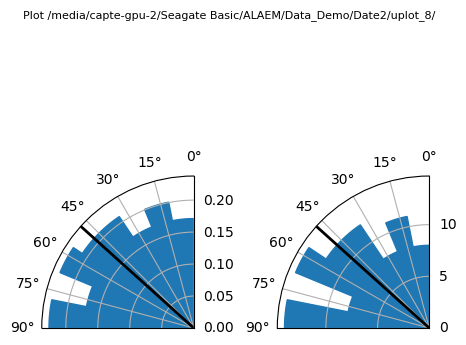

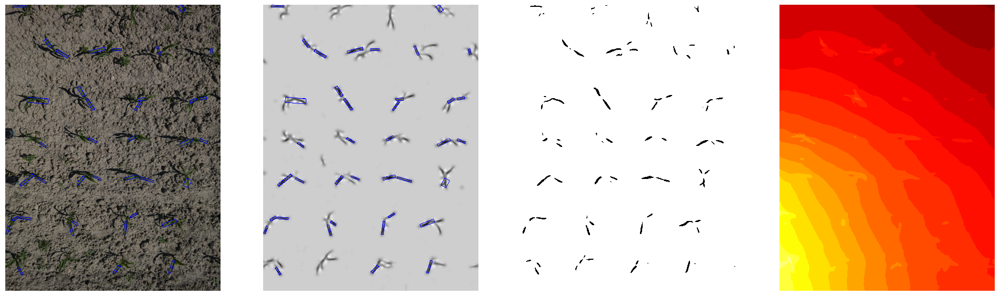

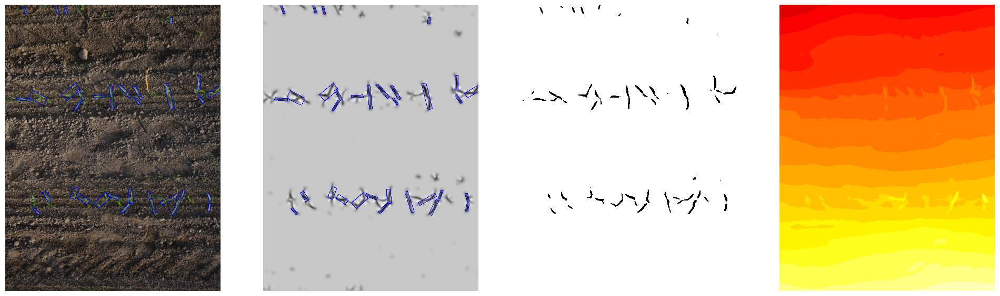

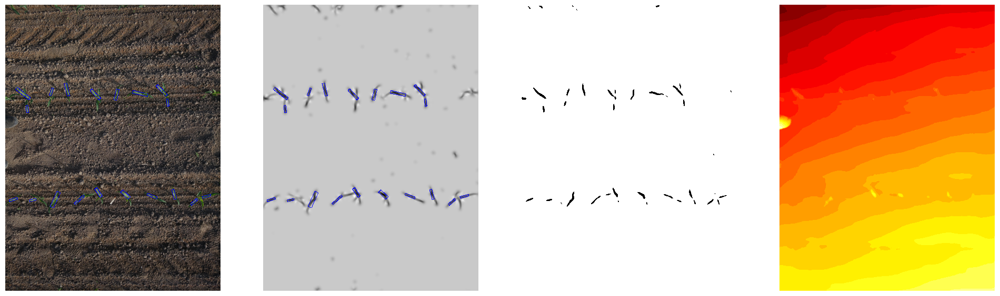

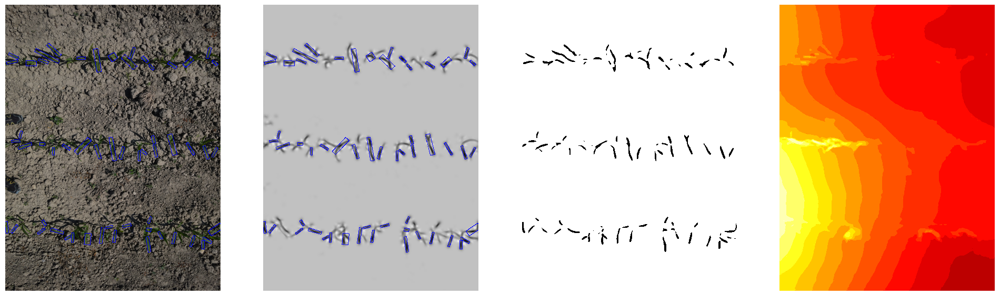

<Figure size 640x480 with 0 Axes>

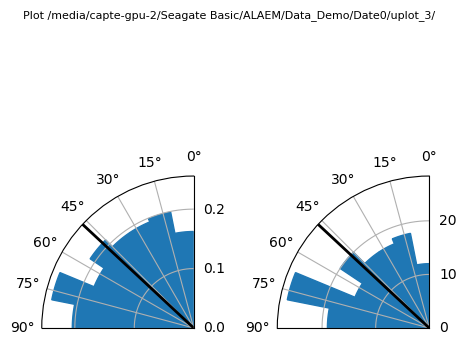

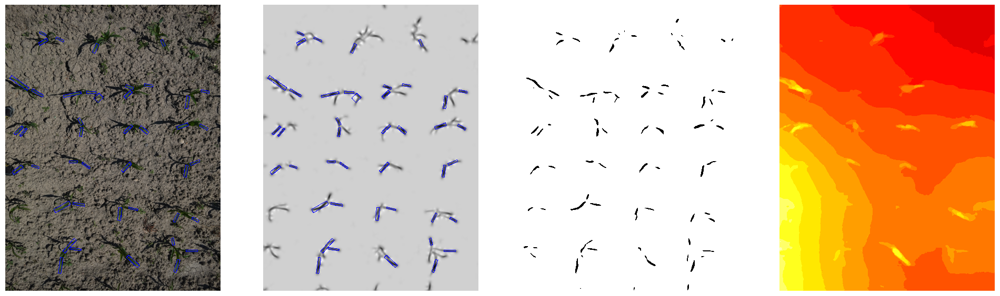

<Figure size 640x480 with 0 Axes>

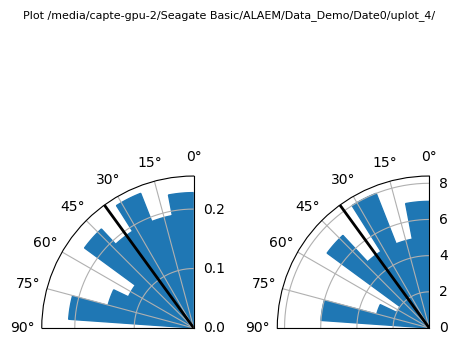

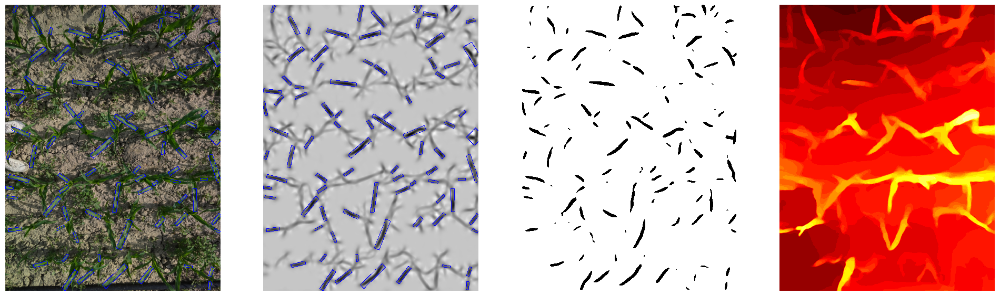

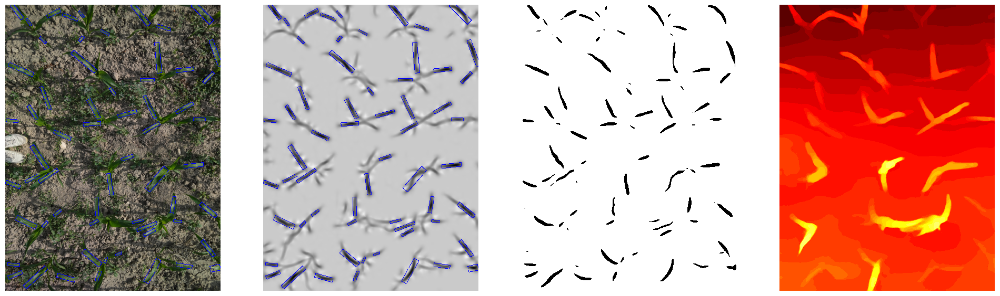

<Figure size 640x480 with 0 Axes>

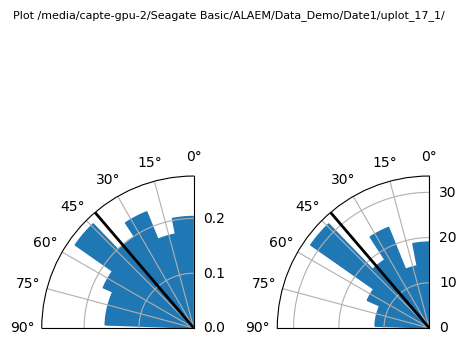

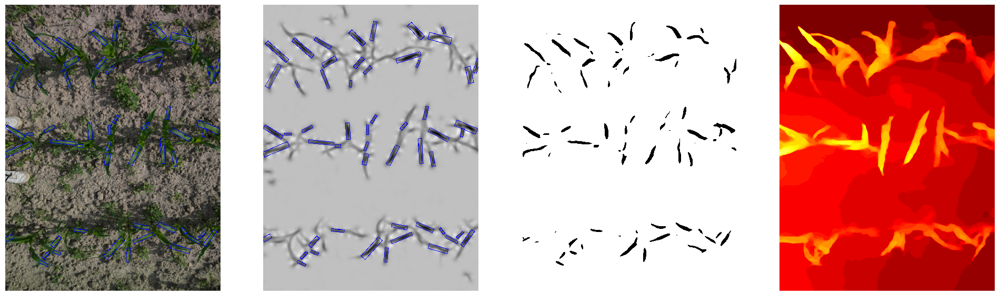

<Figure size 640x480 with 0 Axes>

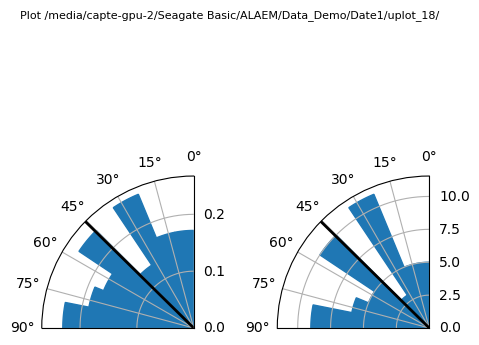

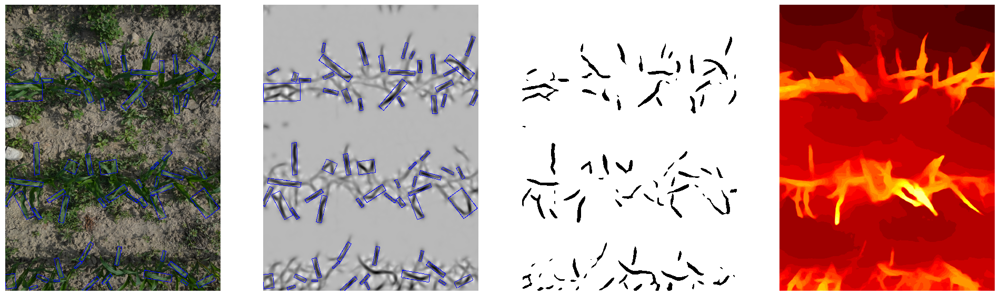

<Figure size 640x480 with 0 Axes>

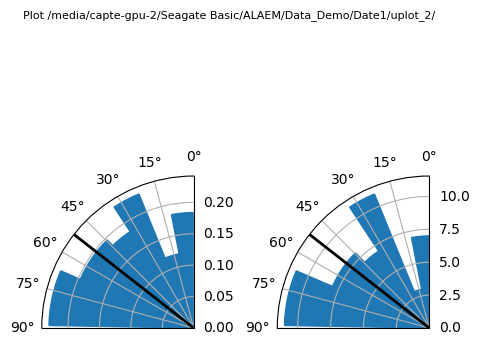

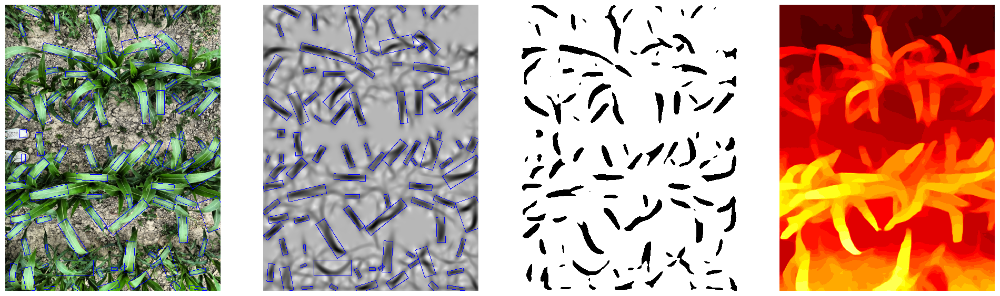

<Figure size 640x480 with 0 Axes>

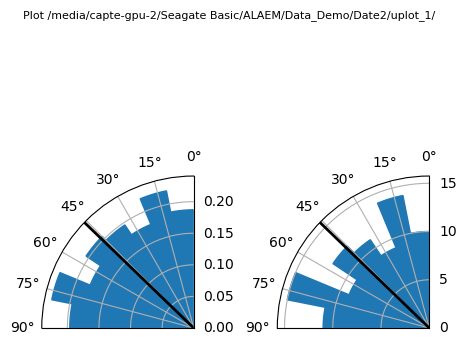

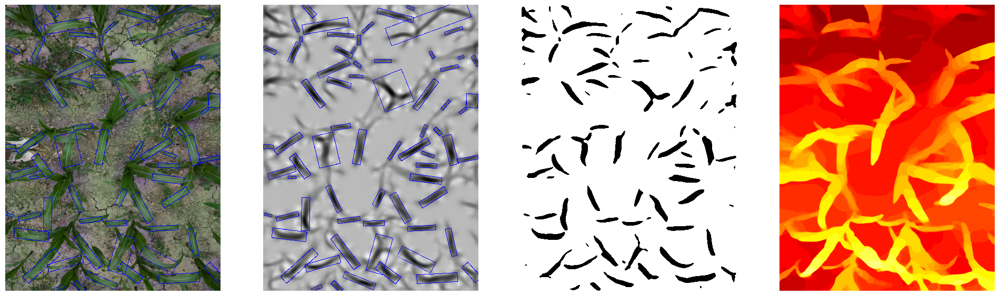

<Figure size 640x480 with 0 Axes>

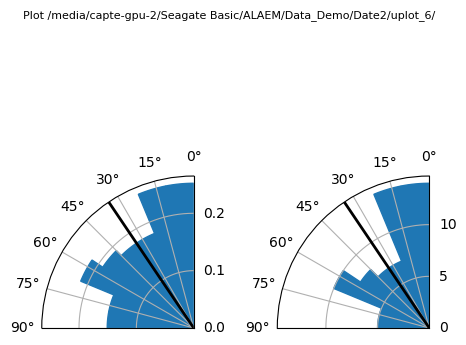

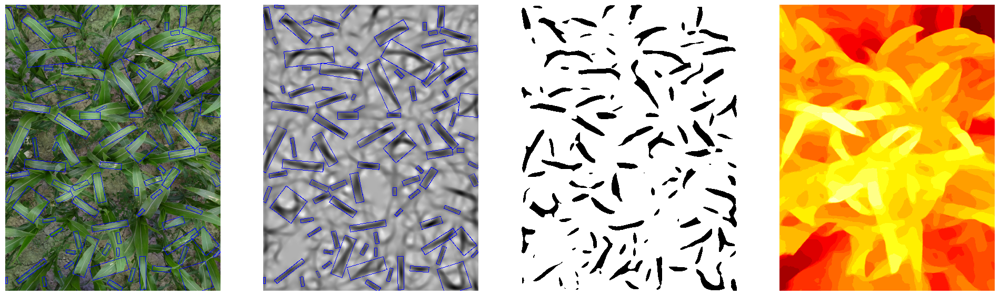

<Figure size 640x480 with 0 Axes>

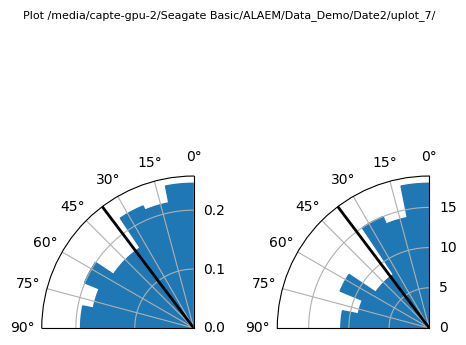

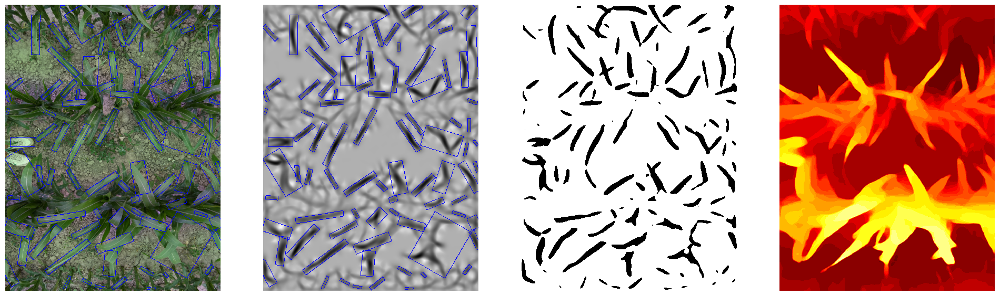

In [7]:
pdf = PdfPages('PATH/TO/output.pdf')
ListFoldersDates = ['PATH/TO/Data_Demo/']

for folder in ListFoldersDates : 

    Date = glob(folder + "/*/")
    for date in Date :

      Plot = glob(date + "/*/")
      for plot in Plot :

        Pic = glob(plot + "/*")
        ang = []

        for pic in Pic:
          if not pic.endswith('.jpg'):
                continue
          else :

            img = cv2.imread(pic)
            img = cv2.resize(img, (int(img.shape[0]/2), int(img.shape[1]/4)), cv2.INTER_CUBIC)
            imgg = cv2.GaussianBlur(cv2.cvtColor(cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE), cv2.COLOR_BGR2RGB), (5, 5), 0)

            with torch.no_grad():
              prediction = midas(transform(imgg).to(device))
              prediction = torch.nn.functional.interpolate(
                  prediction.unsqueeze(1),
                  size=imgg.shape[:2],
                  mode="bicubic",
                  align_corners=False,).squeeze()

            cv2.imwrite(ListFoldersDates[0] + 'raw_depth_map.jpg', prediction.cpu().numpy())

            dpth_image = cv2.cvtColor(cv2.applyColorMap(cv2.cvtColor(cv2.imread(ListFoldersDates[0] + 'raw_depth_map.jpg') * int(255 / np.max(cv2.imread(ListFoldersDates[0] + 'raw_depth_map.jpg'))), cv2.COLOR_BGR2RGB), cv2.COLORMAP_HOT), cv2.COLOR_BGR2RGB)
            nonraw_depth = dpth_image   

            vect = []

            reshape = (cv2.resize(dpth_image, (400,400), cv2.IMREAD_UNCHANGED) * int(255 / np.max(cv2.resize(dpth_image, (400,400), cv2.IMREAD_UNCHANGED)))).reshape((cv2.resize(dpth_image, (400,400), cv2.IMREAD_UNCHANGED).shape[0] * cv2.resize(dpth_image, (400,400), cv2.IMREAD_UNCHANGED).shape[1]), 3)
            cluster = KMeans(n_clusters=10).fit(reshape)
            visualize = cv2.cvtColor(visualize_colors(cluster, cluster.cluster_centers_), cv2.COLOR_RGB2BGR)

            substring_plot = re.search('/P(.+?).jpg', pic)
            #label, label_resized = excessgreen(img) # If no vegetation mask
            label = cv2.imread(plot + 'Mask/' + "P" + substring_plot.group(1) + '.png', 0)      # If you are interested in Background / Green Vegetation / Senescent Vegetation Deep Learning segmentation : https://github.com/mserouar/SegVeg
            label = cv2.resize(label, (int(label.shape[0]/2), int(label.shape[1]/4)), cv2.INTER_CUBIC)
            label[label == 2] = 0 #Remove weed class into background

            img2 = img.copy()
            img = cv2.bitwise_not(cv2.bitwise_not(img, img2), np.zeros(shape=img.shape, dtype=np.uint8), mask=label)[...,::-1]
            img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            from skimage import exposure
            img = exposure.equalize_adapthist(img, clip_limit=0.03)

            if date[-2:] == '0/':
                sigma = 8 
            if date[-2:] == '1/':
                sigma = 12
            if date[-2:] == '2/':
                sigma = 16
            a, b = detect_ridges(img, sigma=sigma)

            # plot_images(img, a, b)
            plt.imsave(ListFoldersDates[0] + 'del.png', b, cmap='gray')

            img = cv2.rotate(cv2.imread(ListFoldersDates[0] + 'del.png'), cv2.cv2.ROTATE_90_CLOCKWISE)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            mask = (gray > 110).astype(np.uint8) 
            bw = mask * 255
            contours, _ = cv2.findContours(mask * 255, cv2.RETR_LIST, cv2.CHAIN_APPROX_NONE)


            for i, c in enumerate(contours):
                area = cv2.contourArea(c)
                if area < 300 or 20000 < area: 
                    continue
                rect = cv2.minAreaRect(c)
                box = np.int0(cv2.boxPoints(rect))

#################################################### FOV MIDDLE #####################################################               
                # vec = []
                # for po in box :
                #     x1 , y1 , x2 , y2 = 300, 400, 1200-300, 1600-400
                #     x, y = po[0], po[1]
                #     FindPoint(x1, y1, x2, y2, x, y)
                # if not any(vec):
                #     continue
#####################################################################################################################
                
                center = (int(rect[0][0]), int(rect[0][1])) 
                width = int(rect[1][0])
                height = int(rect[1][1])
                angle = int(rect[2])

                if width < height:
                    angle = 90 - angle
                else:
                    angle = -angle
                ang.append(np.abs(angle))

                cv2.drawContours(img,[box],0,(0,0,255),2)
                cv2.drawContours(imgg,[box],0,(0,0,255),2)

                dpth_mask = np.zeros((nonraw_depth.shape), dtype=np.uint8)
                pts = np.array( [[box[0],box[1],box[2],box[3]]], dtype=np.int32)
                cv2.fillPoly(dpth_mask, pts, (255,255,255))
                values = nonraw_depth[np.where((dpth_mask == (255,255,255)).all(axis=2))]
                average = values.mean(axis=0)
                idx_depth = []

                for deep in vect:
                  idx_depth.append(np.sqrt((average[0]/255-deep[0])**2 + (average[1]/255-deep[1])**2 + (average[2]/255-deep[2])**2))

                idx = np.argmin(idx_depth)
                dut = [[pic, angle, np.radians(angle), idx]]
                file = open(ListFoldersDates[0] + 'output' + '.csv', 'a+', newline ='') 
                with file:    
                    write = csv.writer(file)
                    write.writerows(dut)

            plot_images(imgg, img, bw, dpth_image)

        fig = plt.figure()
        fig, ax = plt.subplots(1, 2, subplot_kw=dict(projection='polar'),figsize=(5,5))
        fig.suptitle(f"Plot {plot}", fontsize=8)

        ang = np.radians(ang)
        med =  np.median(ang)

        plt.rcParams.update({'font.size': 10})
        plt.subplots_adjust(wspace = .55)
        circular_hist(ax[0], np.array(ang), bins = 8, meds=med)
        circular_hist(ax[1], np.array(ang), bins = 8, density=False, meds=med)
        pdf.savefig(fig)
        
pdf.close()   